In [1]:
import os
import math
import numpy as np
import tensorflow as tf

from PIL import Image
import matplotlib.pyplot as plt
from skimage.io import imread
from skimage.transform import resize
from glob import glob
from albumentations import  HorizontalFlip, RandomSizedCrop, Compose, OneOf, Resize
import json

## Dataset

### Augmentation

In [2]:
# Data Augmentation
def build_augmentation(is_train=True):
    # 훈련용 데이터일 경우
    if is_train:    
        # 50%의 확률로 좌우대칭
        # 50%의 확률로 RandomSizedCrop
        # resize (224,224)
        return Compose([
                        HorizontalFlip(p=0.5),    
                        RandomSizedCrop(         
                            min_max_height=(300, 370),
                            w2h_ratio=370/1242,
                            height=224,
                            width=224,
                            p=0.5
                        ),
                        Resize(width=224, height=224)
                    ])
    # test dataset -> resize(224,224)
    return Compose([ Resize(width=224, height=224) ])

### Kitti Dataset 정의

In [3]:
class KittiGenerator(tf.keras.utils.Sequence):
    
    def __init__(
        self, dir_path,
        batch_size=8,
        img_size=(224,224,3),
        output_size=(224,224),
        is_train=True,
        augmentation=None
    ):
        self.dir_path = dir_path
        self.batch_size = batch_size
        self.img_size = img_size
        self.output_size = output_size
        self.is_train = is_train
        self.augmentation = augmentation
        
        self.data = self.load_dataset()
    
    # dataset path를 통해 image, label 가져오기
    def load_dataset(self):
        input_images = glob(os.path.join(self.dir_path, 'image_2', '*.png'))
        label_images = glob(os.path.join(self.dir_path, 'semantic', '*.png'))
        input_images.sort()
        label_images.sort()
        
        assert len(input_images) == len(label_images)
        
        data = [_ for _ in zip(input_images, label_images)]
        
        if self.is_train: 
            return data[:-30]
        return data[-30:]
    
    def __len__(self):
        return math.ceil(len(self.data) / self.batch_size)
    
    def __getitem__(self, index):
        batch_data = self.data[index*self.batch_size : (index+1)*self.batch_size]
        inputs = np.zeros([self.batch_size, *self.img_size])
        outputs = np.zeros([self.batch_size, *self.output_size])
        
        for i, data in enumerate(batch_data):
            input_img_path, output_path = data
            _input = imread(input_img_path)
            _output = imread(output_path)
            
            # output 7만 1로 변환 -> 7: 도로 segmentation
            _output = (_output==7).astype(np.uint8)*1
            
            data = {
                'image': _input,
                'mask': _output
            }
            augmented = self.augmentation(**data)
            inputs[i] = augmented['image']/255
            outputs[i] = augmented['mask']
        return inputs, outputs
        
    def on_epoch_end(self):
        self.indexes = np.arange(len(self.data))
        
        if self.is_train:
            np.random.shuffle(self.indexes)
            return self.indexes

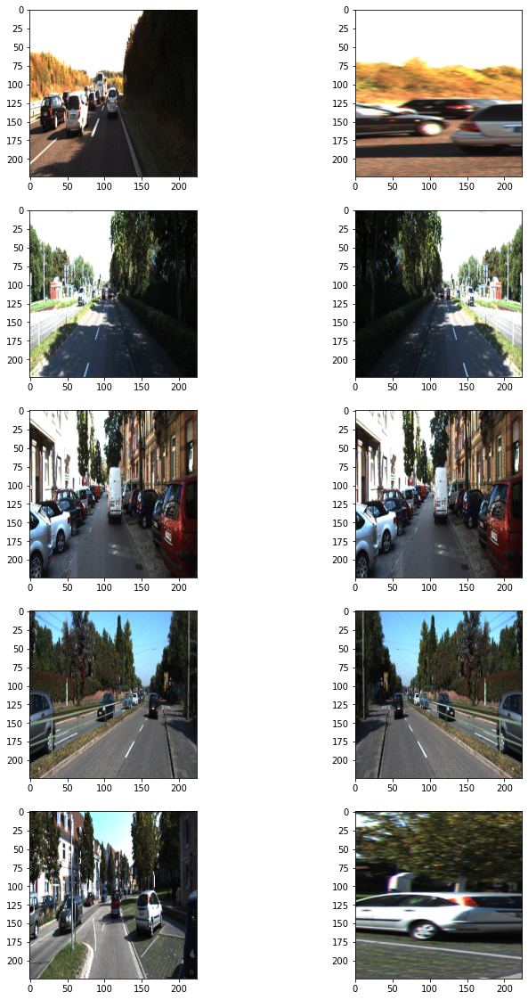

In [4]:
dir_path = os.getenv('HOME')+'/aiffel/semantic_segmentation/data/training'

augmentation_train = build_augmentation()
augmentation_test = build_augmentation(is_train=False)
input_images = glob(os.path.join(dir_path, "image_2", "*.png"))

# 훈련 데이터셋에서 5개만 가져와 augmentation을 적용해 봅시다.  
plt.figure(figsize=(12, 20))
for i in range(5):
    image = imread(input_images[i]) 
    image_data = {"image":image}
    resized = augmentation_test(**image_data)
    processed = augmentation_train(**image_data)
    plt.subplot(5, 2, 2*i+1)
    plt.imshow(resized["image"])  # 왼쪽이 원본이미지
    plt.subplot(5, 2, 2*i+2)
    plt.imshow(processed["image"])  # 오른쪽이 augment된 이미지

plt.show()

[[23 23 23 ... 21 21 21]
 [23 23 23 ... 21 21 21]
 [23 23 23 ... 21 21 21]
 ...
 [ 7  7  7 ... 22 22 22]
 [ 7  7  7 ... 22 22 22]
 [ 7  7  7 ...  7 22 22]]


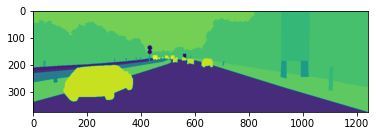

In [5]:
# output data
i = 100
label_sample_path = f'/aiffel/aiffel/semantic_segmentation/data/training/semantic/00{str(i).zfill(4)}_10.png'

label_sample = imread(label_sample_path)

print(label_sample)
plt.imshow(label_sample)
plt.show()

### Train, Test Dataset

In [6]:
augmentation = build_augmentation()
test_preproc = build_augmentation(is_train=False)
        
train_generator = KittiGenerator(
    dir_path, 
    augmentation=augmentation,
)

test_generator = KittiGenerator(
    dir_path, 
    augmentation=test_preproc,
    is_train=False
)

## Model

### U-Net Model

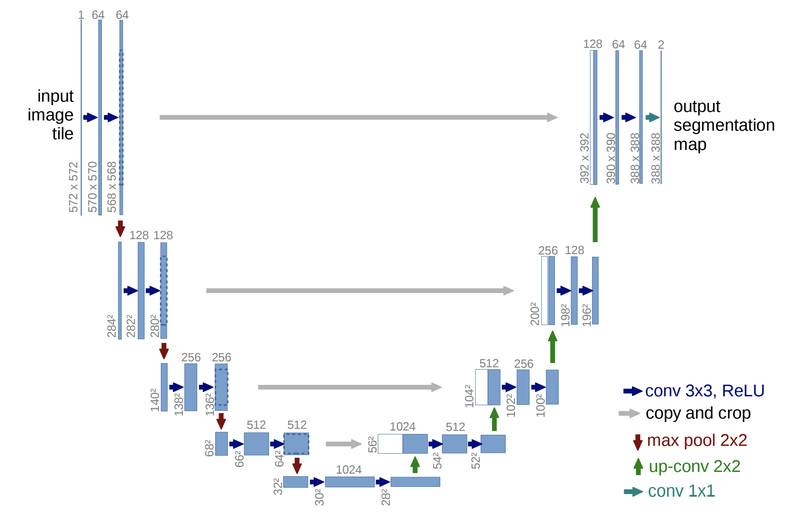

**U-Net 구현**  
1. Conv 내 padding 사용
    - 그림의 U-Net에서는 padding을 사용하지 않음
    - 하지만 쉬운 구현을 위해 padding을 사용함
    - 그에 따라 input의 이미지 크기와 output의 이미지 크기가 동일하게 됨
2. Upsampling은 Conv2DTranspose로 구현
3. 마지막 output은 sigmoid로 구현
    - 각 픽셀의 0,1을 구분하기 때문

In [7]:
def build_model(input_shape=(224, 224, 3)):
    model = None
    
    # down sampling
    inputs = tf.keras.Input(shape=input_shape)
    x = tf.keras.layers.Conv2D(64, 3, activation='relu', padding='same')(inputs)
    x = tf.keras.layers.Conv2D(64, 3, activation='relu', padding='same')(x)
    x_1 = x

    x = tf.keras.layers.MaxPooling2D(pool_size=2, padding='same')(x)
    x = tf.keras.layers.Conv2D(128, 3, activation='relu', padding='same')(x)
    x = tf.keras.layers.Conv2D(128, 3, activation='relu', padding='same')(x)
    x_2 = x

    x = tf.keras.layers.MaxPooling2D(pool_size=2, padding='same')(x)
    x = tf.keras.layers.Conv2D(256, 3, activation='relu', padding='same')(x)
    x = tf.keras.layers.Conv2D(256, 3, activation='relu', padding='same')(x)
    x_3 = x

    x = tf.keras.layers.MaxPooling2D(pool_size=2, padding='same')(x)
    x = tf.keras.layers.Conv2D(512, 3, activation='relu', padding='same')(x)
    x = tf.keras.layers.Conv2D(512, 3, activation='relu', padding='same')(x)
    x_4 = x
    
    # up sampling
    x = tf.keras.layers.MaxPooling2D(pool_size=2, padding='same')(x)
    x = tf.keras.layers.Conv2D(1024, 3, activation='relu', padding='same')(x)
    x = tf.keras.layers.Conv2D(1024, 3, activation='relu', padding='same')(x)
    
    x = tf.keras.layers.Conv2DTranspose(512, 3, strides=2, activation=None, padding='same')(x)
    x = tf.keras.layers.Concatenate()([x, x_4])
    x = tf.keras.layers.Conv2D(512, 3, activation='relu', padding='same')(x)
    x = tf.keras.layers.Conv2D(512, 3, activation='relu', padding='same')(x)

    x = tf.keras.layers.Conv2DTranspose(256, 3, strides=2, activation=None, padding='same')(x)
    x = tf.keras.layers.Concatenate()([x, x_3])
    x = tf.keras.layers.Conv2D(256, 3, activation='relu', padding='same')(x)
    x = tf.keras.layers.Conv2D(256, 3, activation='relu', padding='same')(x)

    x = tf.keras.layers.Conv2DTranspose(128, 3, strides=2, activation=None, padding='same')(x)
    x = tf.keras.layers.Concatenate()([x, x_2])
    x = tf.keras.layers.Conv2D(128, 3, activation='relu', padding='same')(x)
    x = tf.keras.layers.Conv2D(128, 3, activation='relu', padding='same')(x)

    x = tf.keras.layers.Conv2DTranspose(64, 3, strides=2, activation=None, padding='same')(x)
    x = tf.keras.layers.Concatenate()([x, x_1])
    x = tf.keras.layers.Conv2D(64, 3, activation='relu', padding='same')(x)
    x = tf.keras.layers.Conv2D(64, 3, activation='relu', padding='same')(x)
    
    # 224,224,1 output
    outputs = tf.keras.layers.Conv2D(1, 1, activation='sigmoid', padding='same')(x)

    model = tf.keras.Model(inputs=inputs, outputs=outputs)
    return model

build_model().summary()

Model: "model"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            [(None, 224, 224, 3) 0                                            
__________________________________________________________________________________________________
conv2d (Conv2D)                 (None, 224, 224, 64) 1792        input_1[0][0]                    
__________________________________________________________________________________________________
conv2d_1 (Conv2D)               (None, 224, 224, 64) 36928       conv2d[0][0]                     
__________________________________________________________________________________________________
max_pooling2d (MaxPooling2D)    (None, 112, 112, 64) 0           conv2d_1[0][0]                   
______________________________________________________________________________________________

### Model Train

In [8]:
EPOCHS = 100

learning_rate = 1e-4

model = build_model()
model.compile(optimizer = tf.keras.optimizers.Adam(learning_rate), loss = 'binary_crossentropy')

callback_checkpoint = tf.keras.callbacks.ModelCheckpoint(
    filepath = f'./checkpoint/unet_lr_{learning_rate}.hdf5',
    save_best_only=True,
    save_weights_only = True,
    monitor='val_loss'
)

callback_earlystop = tf.keras.callbacks.EarlyStopping(monitor='val_loss', patience=5)

history = model.fit(
    train_generator,
    validation_data=test_generator,
    steps_per_epoch=len(train_generator),
    epochs=EPOCHS,
    callbacks=[
        callback_checkpoint,
        #callback_earlystop
    ]
 )

model_path = f'./model/unet_lr_{learning_rate}.h5'
model.save(model_path)

with open(f'./model/unet_lr_{learning_rate}.json', 'w') as f:
    json.dump(history.history, f)

Epoch 1/100
22/22 [==============================] - 23s 452ms/step - loss: 0.6199 - val_loss: 0.5962
Epoch 2/100
22/22 [==============================] - 10s 429ms/step - loss: 0.5490 - val_loss: 0.4865
Epoch 3/100
22/22 [==============================] - 10s 432ms/step - loss: 0.3611 - val_loss: 0.6364
Epoch 4/100
22/22 [==============================] - 10s 434ms/step - loss: 0.3024 - val_loss: 0.2782
Epoch 5/100
22/22 [==============================] - 10s 439ms/step - loss: 0.2945 - val_loss: 0.5827
Epoch 6/100
22/22 [==============================] - 10s 440ms/step - loss: 0.2627 - val_loss: 0.2658
Epoch 7/100
22/22 [==============================] - 10s 441ms/step - loss: 0.2433 - val_loss: 0.3526
Epoch 8/100
22/22 [==============================] - 10s 446ms/step - loss: 0.2165 - val_loss: 0.2373
Epoch 9/100
22/22 [==============================] - 10s 445ms/step - loss: 0.2030 - val_loss: 0.3114
Epoch 10/100
22/22 [==============================] - 10s 444ms/step - loss: 0.194

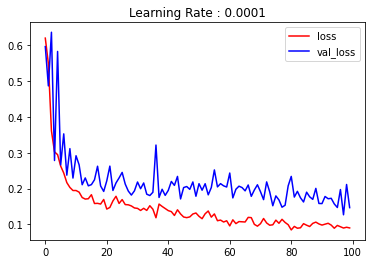

In [9]:
plt.title(f'Learning Rate : {learning_rate}')
plt.plot(history.history['loss'], 'r', label='loss')
plt.plot(history.history['val_loss'], 'b', label='val_loss')
plt.legend()
plt.show()

같은 epoch 내에 learning rate를 조절하면 더 잘 내려갈까?

In [10]:
EPOCHS = 100

learning_rate = 3e-4

model = build_model()
model.compile(optimizer = tf.keras.optimizers.Adam(learning_rate), loss = 'binary_crossentropy')

callback_checkpoint = tf.keras.callbacks.ModelCheckpoint(
    filepath = f'./checkpoint/unet_lr_{learning_rate}.hdf5',
    save_best_only=True,
    save_weights_only = True,
    monitor='val_loss'
)

callback_earlystop = tf.keras.callbacks.EarlyStopping(monitor='val_loss', patience=5)

history = model.fit(
    train_generator,
    validation_data=test_generator,
    steps_per_epoch=len(train_generator),
    epochs=EPOCHS,
    callbacks=[
        callback_checkpoint,
        #callback_earlystop
    ]
 )

model_path = f'./model/unet_lr_{learning_rate}.h5'
model.save(model_path)

with open(f'./model/unet_lr_{learning_rate}.json', 'w') as f:
    json.dump(history.history, f)

Epoch 1/100
22/22 [==============================] - 11s 462ms/step - loss: 0.6567 - val_loss: 0.6140
Epoch 2/100
22/22 [==============================] - 10s 438ms/step - loss: 0.5662 - val_loss: 0.4580
Epoch 3/100
22/22 [==============================] - 10s 441ms/step - loss: 0.4085 - val_loss: 0.4421
Epoch 4/100
22/22 [==============================] - 10s 439ms/step - loss: 0.2852 - val_loss: 0.3105
Epoch 5/100
22/22 [==============================] - 10s 441ms/step - loss: 0.2773 - val_loss: 0.3143
Epoch 6/100
22/22 [==============================] - 10s 437ms/step - loss: 0.2720 - val_loss: 0.2806
Epoch 7/100
22/22 [==============================] - 10s 436ms/step - loss: 0.3037 - val_loss: 0.2770
Epoch 8/100
22/22 [==============================] - 10s 438ms/step - loss: 0.2631 - val_loss: 0.2697
Epoch 9/100
22/22 [==============================] - 10s 436ms/step - loss: 0.2145 - val_loss: 0.2766
Epoch 10/100
22/22 [==============================] - 10s 437ms/step - loss: 0.184

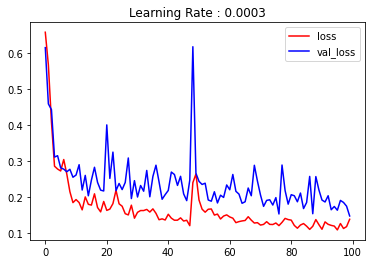

In [11]:
plt.title(f'Learning Rate : {learning_rate}')
plt.plot(history.history['loss'], 'r', label='loss')
plt.plot(history.history['val_loss'], 'b', label='val_loss')
plt.legend()
plt.show()

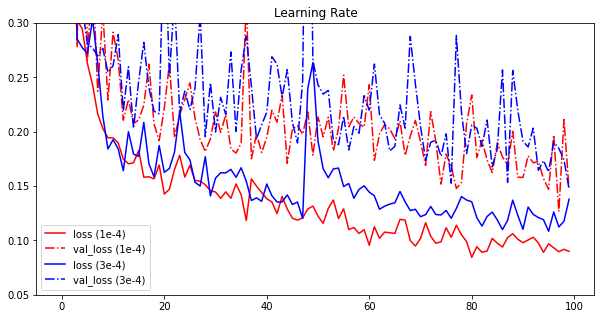

In [62]:
with open('./model/unet_lr_0.0001.json', 'r')as f:
    history_1 = json.load(f)

plt.figure(figsize=(10,5))
plt.title(f'Learning Rate')
plt.plot(history_1['loss'], 'r', label='loss (1e-4)')
plt.plot(history_1['val_loss'], 'r-.', label='val_loss (1e-4)')
plt.plot(history.history['loss'], 'b', label='loss (3e-4)')
plt.plot(history.history['val_loss'], 'b-.', label='val_loss (3e-4)')
plt.ylim(0.05, 0.3)
plt.legend()
plt.show()

두 learning rate 모두 점점 내려가는 모습임.
- 좀 더 학습이 가능할 것 같음

learning_rate를 올리니까 loss가 더 높은 결과가 나타남.  
- 50 epoch에 한번 튀면서 다음 학습에 영향이 간 듯.

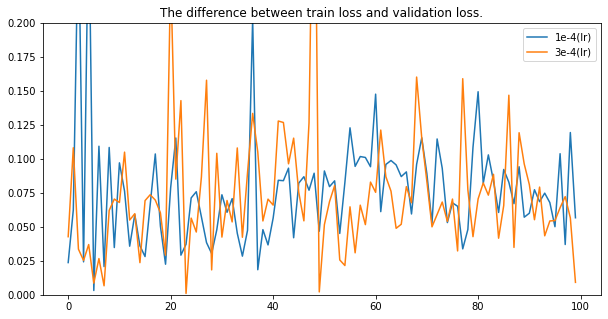

lr 1e-4 Mean : 0.076
lr 3e-4 Mean : 0.074


In [63]:
plt.figure(figsize=(10,5))
plt.title(f'The difference between train loss and validation loss.')

plt.plot(np.abs(np.array(history_1['val_loss']) - np.array(history_1['loss'])))
plt.plot(np.abs(np.array(history.history['val_loss']) - np.array(history.history['loss'])))
plt.ylim(0, 0.2)
plt.legend(['1e-4(lr)', '3e-4(lr)'])
plt.show()

print(f"lr 1e-4 Mean : {np.mean(np.abs(np.array(history_1['val_loss']) - np.array(history_1['loss']))):.3f}")
print(f"lr 3e-4 Mean : {np.mean(np.abs(np.array(history.history['val_loss']) - np.array(history.history['loss']))):.3f}")

train loss와 validation loss의 차이
- 1e-4, 3e-4 둘 다 비슷한 차이를 보이는 듯 함.

## Prediction

In [87]:
def calculate_iou_score(target, prediction, show_iou=True):
    intersection = np.logical_and(target, prediction)# intersection을 구하는 코드를 작성해주세요.
    union = np.logical_or(target, prediction)# Union을 구하는 코드를 작성해주세요.
    iou_score = np.sum(intersection) / np.sum(union)# iou 스코어를 구하되 결과값을 float로 만들어주세요!
    if show_iou:
        print('IoU : %f' % iou_score )
    return iou_score

In [88]:
def get_output(model, preproc, image_path, output_path, label_path, threshold=0.5, show_image=True):
    
    origin_img = imread(image_path)
    data = {"image":origin_img}
    processed = preproc(**data)
    output = model(np.expand_dims(processed["image"]/255,axis=0))
    output = (output[0].numpy()>=threshold).astype(np.uint8).squeeze(-1)*255
    prediction = output/255   # 도로로 판단한 영역
    
    output = Image.fromarray(output)
    background = Image.fromarray(origin_img).convert('RGBA')
    output = output.resize((origin_img.shape[1], origin_img.shape[0])).convert('RGBA')
    output = Image.blend(background, output, alpha=0.5)
    #output.show()   # 도로로 판단한 영역을 시각화!
    
    if show_image:
        plt.figure(figsize=(20,8))
        plt.subplot(121)
        plt.imshow(origin_img)
        plt.axis('off')
        plt.subplot(122)
        plt.imshow(output)
        plt.axis('off')
        plt.show()
    
    if label_path:   
        label_img = imread(label_path)
        label_data = {"image":label_img}
        label_processed = preproc(**label_data)
        label_processed = label_processed["image"]
        target = (label_processed == 7).astype(np.uint8)*1   # 라벨에서 도로로 기재된 영역

        return output, prediction, target
    else:
        return output, prediction, _

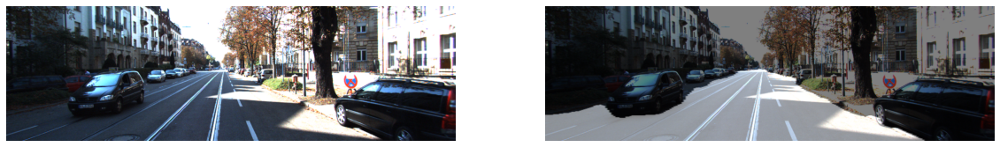

0번 image
IoU : 0.928909


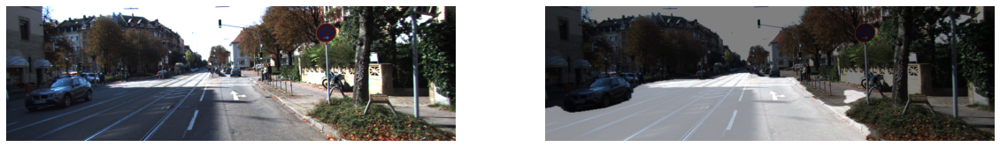

1번 image
IoU : 0.921425


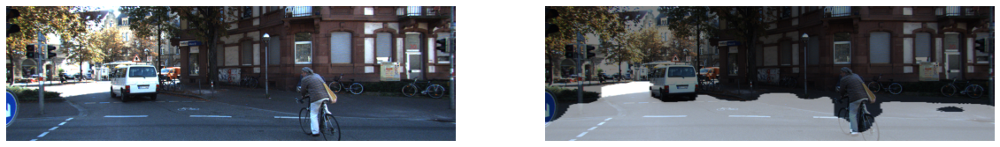

2번 image
IoU : 0.732572


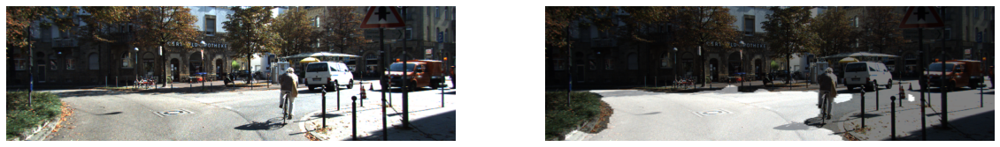

3번 image
IoU : 0.778976


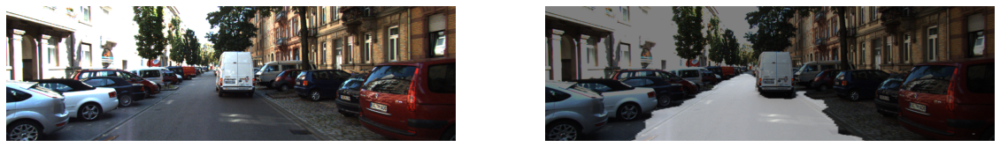

4번 image
IoU : 0.847371


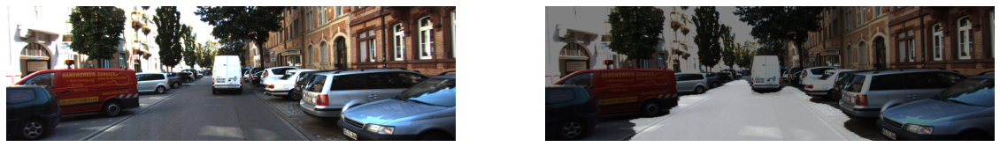

5번 image
IoU : 0.781379


In [89]:
# 다양한 이미지로 테스트 시도
model.load_weights('./checkpoint/unet_lr_0.0001.hdf5')
iou_1e = []

for i in range(20):
    if i <= 5:
        output, prediction, target = get_output(
            model, 
            test_preproc,
            image_path=dir_path + f'/image_2/00{str(i).zfill(4)}_10.png',
            output_path=dir_path + f'./result_{str(i).zfill(3)}.png',
            label_path=dir_path + f'/semantic/00{str(i).zfill(4)}_10.png'
        )
        print(f'{i}번 image')
        iou_1e.append(calculate_iou_score(target, prediction))
    else:
        output, prediction, target = get_output(
            model, 
            test_preproc,
            image_path=dir_path + f'/image_2/00{str(i).zfill(4)}_10.png',
            output_path=dir_path + f'./result_{str(i).zfill(3)}.png',
            label_path=dir_path + f'/semantic/00{str(i).zfill(4)}_10.png',
            show_image=False
        )
        iou_1e.append(calculate_iou_score(target, prediction, show_iou=False))


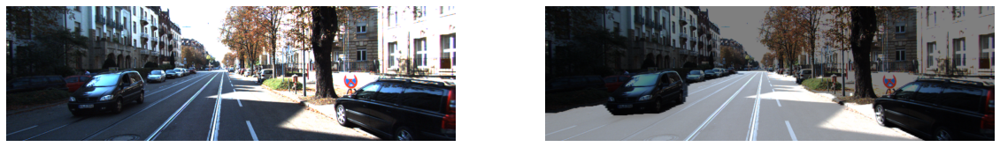

0번 image
IoU : 0.934016


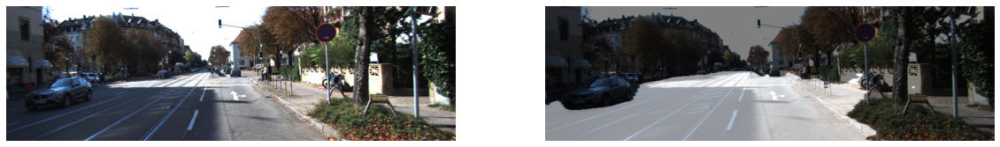

1번 image
IoU : 0.851864


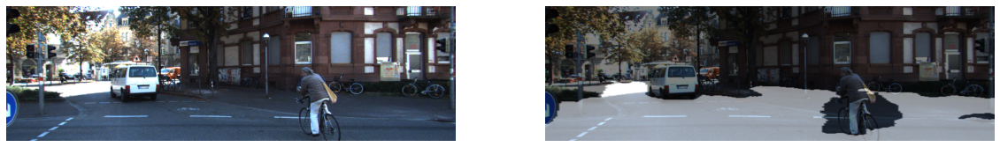

2번 image
IoU : 0.670946


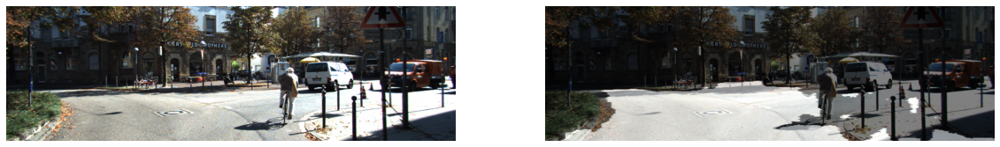

3번 image
IoU : 0.706245


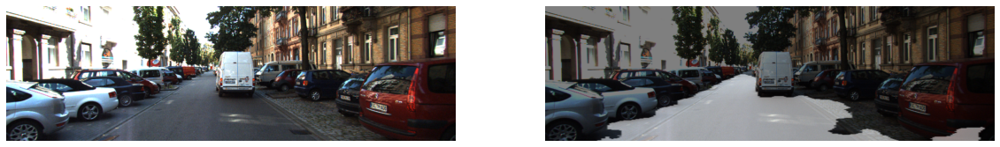

4번 image
IoU : 0.709021


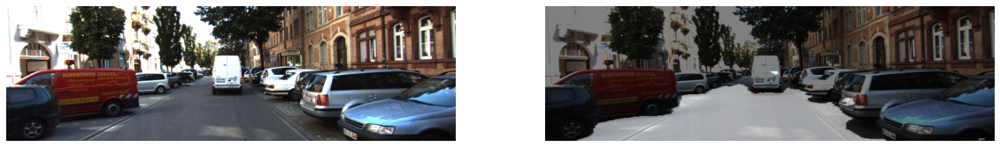

5번 image
IoU : 0.706566


In [90]:
# 다양한 이미지로 테스트 시도
model.load_weights('./checkpoint/unet_lr_0.0003.hdf5')
iou_3e = []

for i in range(20):
    if i <= 5:
        output, prediction, target = get_output(
            model, 
            test_preproc,
            image_path=dir_path + f'/image_2/00{str(i).zfill(4)}_10.png',
            output_path=dir_path + f'./result_{str(i).zfill(3)}.png',
            label_path=dir_path + f'/semantic/00{str(i).zfill(4)}_10.png'
        )
        print(f'{i}번 image')
        iou_3e.append(calculate_iou_score(target, prediction))
    else:
        output, prediction, target = get_output(
            model, 
            test_preproc,
            image_path=dir_path + f'/image_2/00{str(i).zfill(4)}_10.png',
            output_path=dir_path + f'./result_{str(i).zfill(3)}.png',
            label_path=dir_path + f'/semantic/00{str(i).zfill(4)}_10.png',
            show_image=False
        )
        iou_3e.append(calculate_iou_score(target, prediction, show_iou=False))

## U-Net++

In [16]:
def standard_unit(x, n):
    x = tf.keras.layers.Conv2D(n, 3, activation='relu', padding='same')(x)
    x = tf.keras.layers.Conv2D(n, 3, activation='relu', padding='same')(x)
    return x

def build_UNetPP(input_shape=(224, 224, 3)):
    model = None
     
    inputs = tf.keras.Input(shape=input_shape)
    
    # down sampling
    x_0 = standard_unit(inputs, 64)
    x = tf.keras.layers.MaxPooling2D(pool_size=2, padding='same')(x_0)
    x_1 = standard_unit(x, 128)
    x = tf.keras.layers.MaxPooling2D(pool_size=2, padding='same')(x_1)
    x_2 = standard_unit(x, 256)
    x = tf.keras.layers.MaxPooling2D(pool_size=2, padding='same')(x_2)
    x_3 = standard_unit(x, 512)
    x = tf.keras.layers.MaxPooling2D(pool_size=2, padding='same')(x_3)
    
    x = tf.keras.layers.Conv2D(1024, 3, activation='relu', padding='same')(x)
    x = tf.keras.layers.Conv2D(1024, 3, activation='relu', padding='same')(x)

    # up sampling
    # X(3,1)
    x = tf.keras.layers.Conv2DTranspose(512, 3, strides=2, padding='same')(x)
    x = tf.keras.layers.Concatenate()([x, x_3])
    x = standard_unit(x, 512)
    
    # X(2,1)
    up_3 = tf.keras.layers.Conv2DTranspose(256, 3, strides=2, padding='same')(x_3)
    x_2_1 = tf.keras.layers.Concatenate()([x_2, up_3])
    x_2_1 = standard_unit(x_2_1, 256)
    
    # X(2,2)
    x = tf.keras.layers.Conv2DTranspose(256, 3, strides=2, padding='same')(x)
    x = tf.keras.layers.Concatenate()([x_2, x_2_1, x])
    x = standard_unit(x, 256)
    
    # X(1,1)
    up_2 = tf.keras.layers.Conv2DTranspose(128, 3, strides=2, padding='same')(x_2)
    x_1_1 = tf.keras.layers.Concatenate()([x_1, up_2])
    x_1_1 = standard_unit(x_1_1, 128)
    
    # X(1,2)
    up_2_1 = tf.keras.layers.Conv2DTranspose(128, 3, strides=2, padding='same')(x_2_1)
    x_1_2 = tf.keras.layers.Concatenate()([x_1, up_2_1, x_1_1])
    x_1_2 = standard_unit(x_1_2, 128)
    
    # X(1,3)
    x = tf.keras.layers.Conv2DTranspose(128, 3, strides=2, padding='same')(x)
    x = tf.keras.layers.Concatenate()([x_1, x_1_1, x_1_2, x])
    x = standard_unit(x, 128)
    
    # X(0,1)
    up_1 = tf.keras.layers.Conv2DTranspose(64, 3, strides=2, padding='same')(x_1)
    x_0_1 = tf.keras.layers.Concatenate()([x_0, up_1])
    x_0_1 = standard_unit(x_0_1, 64)
    
    # X(0,2)
    up_1_1 = tf.keras.layers.Conv2DTranspose(64, 3, strides=2, padding='same')(x_1_1)
    x_0_2 = tf.keras.layers.Concatenate()([x_0, x_0_1, up_1_1])
    x_0_2 = standard_unit(x_0_2, 64)
    
    # X(0,3)
    up_1_2 = tf.keras.layers.Conv2DTranspose(64, 3, strides=2, padding='same')(x_1_2)
    x_0_3 = tf.keras.layers.Concatenate()([x_0, x_0_1, x_0_2, up_1_2])
    x_0_3 = standard_unit(x_0_3, 64)
    
    # X(0,4)
    x = tf.keras.layers.Conv2DTranspose(64, 3, strides=2, padding='same')(x)
    x = tf.keras.layers.Concatenate()([x_0, x_0_1, x_0_2, x_0_3, x])
    x = standard_unit(x, 64)
    
    outputs = tf.keras.layers.Conv2D(1, 1, activation='sigmoid', padding='same')(x)
    
    model = tf.keras.Model(inputs=inputs, outputs=outputs)
    return model

In [17]:
# Custom loss function
def binary_cross_entropy_loss(y_true, y_pred):
    loss = tf.keras.losses.BinaryCrossentropy(from_logits=False)
    return loss(y_true, y_pred)

def dice_loss(y_true, y_pred):
    y_true_f = tf.keras.backend.flatten(y_true)
    y_pred_f = tf.keras.backend.flatten(y_pred)
    intersection = tf.keras.backend.sum(y_true_f * y_pred_f)
    return 1 - (2. * intersection + 1) / (tf.keras.backend.sum(y_true_f) + tf.keras.backend.sum(y_pred_f) + 1)

def bce_dice_loss(y_true, y_pred):
    bce = tf.keras.losses.BinaryCrossentropy(from_logits=False)(y_true, y_pred)
    dice = dice_loss(y_true, y_pred)
    return bce + dice

### U-Net++ Train

In [18]:
EPOCHS = 100

UNetPP = build_UNetPP()
UNetPP.compile(optimizer = tf.keras.optimizers.Adam(1e-4), loss = bce_dice_loss)

callback_checkpoint = tf.keras.callbacks.ModelCheckpoint(
    filepath = f'./checkpoint/unetpp_base.hdf5',
    save_best_only=True,
    save_weights_only = True,
    monitor='val_loss'
)

callback_earlystop = tf.keras.callbacks.EarlyStopping(monitor='val_loss', patience=5)

history_unetpp = UNetPP.fit(
    train_generator,
    validation_data=test_generator,
    steps_per_epoch=len(train_generator),
    epochs=EPOCHS,
    callbacks=[
        callback_checkpoint,
        #callback_earlystop
    ]
 )

unetpp_path = f'./model/unetpp_base.h5'
UNetPP.save(unetpp_path)

with open(f'./model/unetpp_base.json', 'w') as f:
    json.dump(history_unetpp, f)

Epoch 1/100
22/22 [==============================] - 35s 1s/step - loss: 1.3777 - val_loss: 1.3232
Epoch 2/100
22/22 [==============================] - 23s 1s/step - loss: 1.2226 - val_loss: 1.1515
Epoch 3/100
22/22 [==============================] - 23s 1s/step - loss: 0.8514 - val_loss: 0.7161
Epoch 4/100
22/22 [==============================] - 23s 1s/step - loss: 0.6827 - val_loss: 0.6845
Epoch 5/100
22/22 [==============================] - 23s 1s/step - loss: 0.4892 - val_loss: 0.5337
Epoch 6/100
22/22 [==============================] - 23s 1s/step - loss: 0.4840 - val_loss: 0.5544
Epoch 7/100
22/22 [==============================] - 23s 1s/step - loss: 0.4773 - val_loss: 0.5687
Epoch 8/100
22/22 [==============================] - 23s 1s/step - loss: 0.3962 - val_loss: 0.4620
Epoch 9/100
22/22 [==============================] - 23s 1s/step - loss: 0.3762 - val_loss: 0.5299
Epoch 10/100
22/22 [==============================] - 23s 1s/step - loss: 0.4438 - val_loss: 0.5862
Epoch 11/

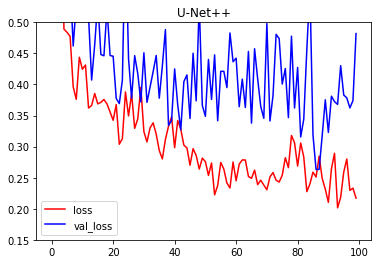

In [72]:
plt.title('U-Net++')
plt.plot(history_unetpp.history['loss'], 'r', label='loss')
plt.plot(history_unetpp.history['val_loss'], 'b', label='val_loss')
plt.ylim(0.15, 0.5)
plt.legend()
plt.show()

좀 더 가봐야 정확한 지표를 알 수 있을 것 같음.  
만약 이후에 val_loss와 loss의 차이가 더 심해지면 overfitting라고 생각해도 될 듯. 

## Prediction

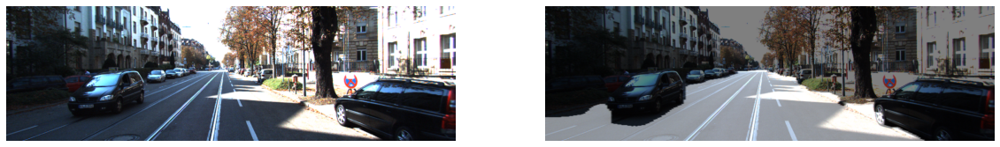

0번 image
IoU : 0.884128


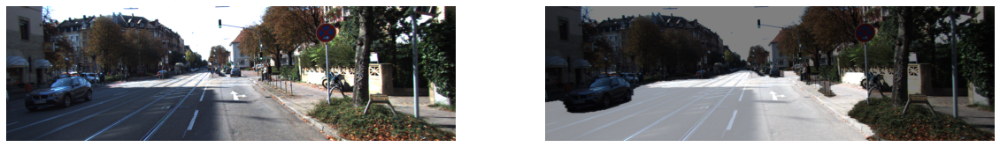

1번 image
IoU : 0.863877


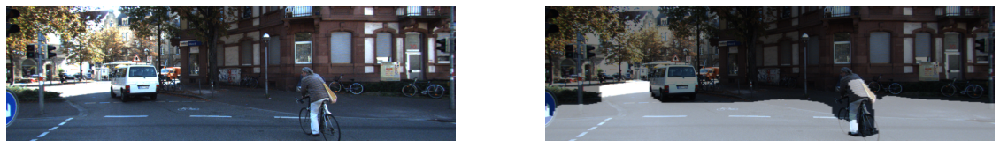

2번 image
IoU : 0.698612


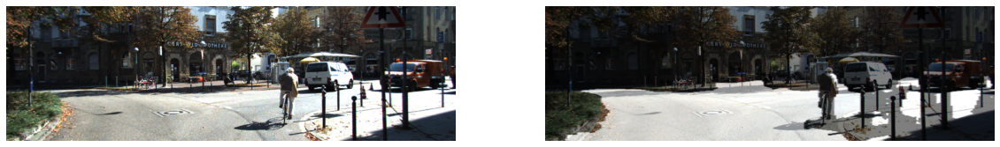

3번 image
IoU : 0.750425


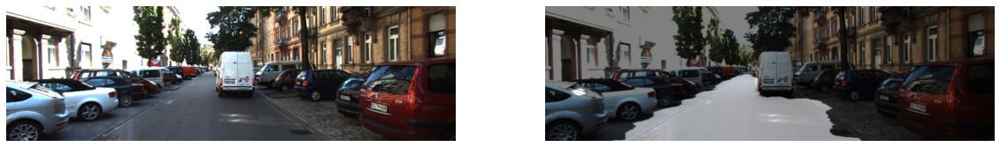

4번 image
IoU : 0.815401


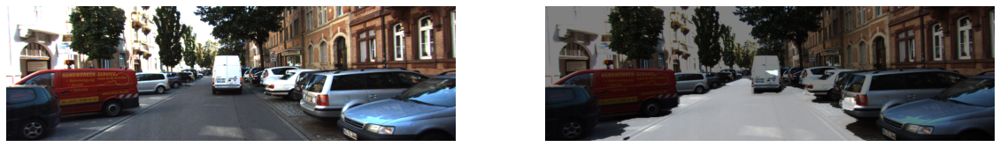

5번 image
IoU : 0.737647


In [91]:
# 다양한 이미지로 테스트 시도
UNetPP.load_weights('./checkpoint/unetpp_base.hdf5')
iou_unetpp = []

for i in range(20):
    if i <=5:
        output, prediction, target = get_output(
            UNetPP, 
            test_preproc,
            image_path=dir_path + f'/image_2/00{str(i).zfill(4)}_10.png',
            output_path=dir_path + f'./result_{str(i).zfill(3)}.png',
            label_path=dir_path + f'/semantic/00{str(i).zfill(4)}_10.png'
        )
        print(f'{i}번 image')
        iou_unetpp.append(calculate_iou_score(target, prediction))
        
    else:
        output, prediction, target = get_output(
            UNetPP, 
            test_preproc,
            image_path=dir_path + f'/image_2/00{str(i).zfill(4)}_10.png',
            output_path=dir_path + f'./result_{str(i).zfill(3)}.png',
            label_path=dir_path + f'/semantic/00{str(i).zfill(4)}_10.png',
            show_image=False
        )
        iou_unetpp.append(calculate_iou_score(target, prediction, show_iou=False))

## IoU 점수 종합

In [93]:
import pandas as pd

total_iou = []
total_iou.append(iou_1e)
total_iou.append(iou_3e)
total_iou.append(iou_unetpp)

pd_iou = pd.DataFrame(total_iou, index=['U-Net 1e-4(Best)', 'U-Net 3e-4(Best)', 'U-Net++(Best)']).T
pd_iou

,U-Net 1e-4(Best),U-Net 3e-4(Best),U-Net++(Best)
0,0.928909,0.934016,0.884128
1,0.921425,0.851864,0.863877
2,0.732572,0.670946,0.698612
3,0.778976,0.706245,0.750425
4,0.847371,0.709021,0.815401
5,0.781379,0.706566,0.737647
6,0.745655,0.600029,0.627698
7,0.795400,0.779087,0.846117
8,0.890523,0.865470,0.835102
9,0.863801,0.815528,0.787636


In [81]:
print('Val_loss Min')
print(f"U-Net 1e-4 : {np.array(history_1['val_loss']).min():.3f}")
print(f"U-Net 3e-4 : {np.array(history.history['val_loss']).min():.3f}")
print(f"U-Net++ : {np.array(history_unetpp.history['val_loss']).min():.3f}")

Val_loss Min
U-Net 1e-4 : 0.127
U-Net 3e-4 : 0.147
U-Net++ : 0.263


U-Net++의 Loss 지표가 다르다는 것을 감안하고 Validation Loss를 기준으로 봤을 때,  
대부분의 이미지에서 U-Net 1e-4가 높은 지표를 가져감.  
Val_loss의 지표가 작은 것이 일반화 성능에는 더 좋게 작용하는 듯.  

7번 image


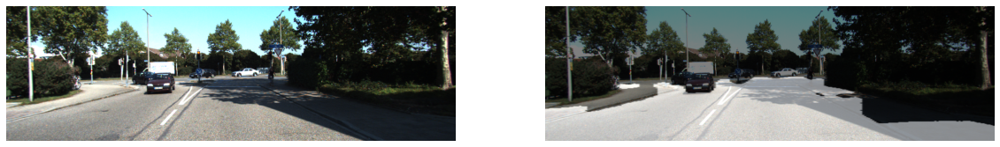

U-Net Model
IoU : 0.795400


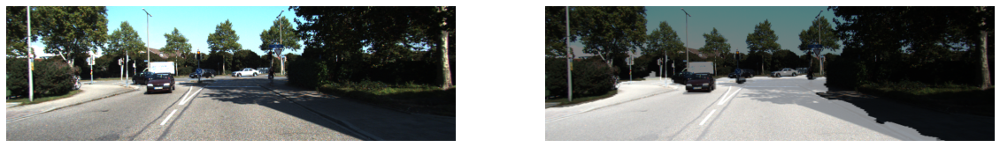

U-Net++ Model
IoU : 0.846117

11번 image


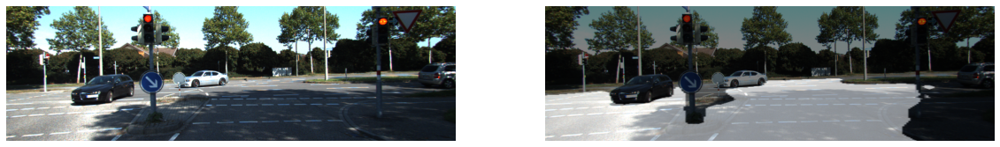

U-Net Model
IoU : 0.823680


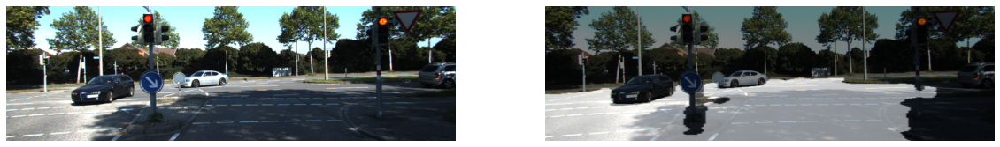

U-Net++ Model
IoU : 0.844868

12번 image


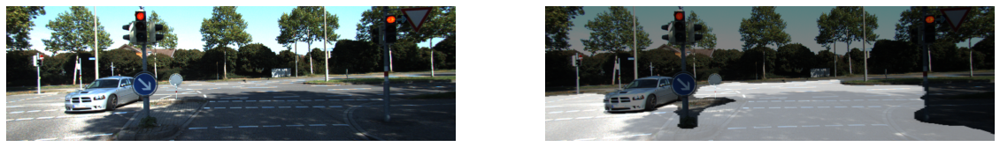

U-Net Model
IoU : 0.730166


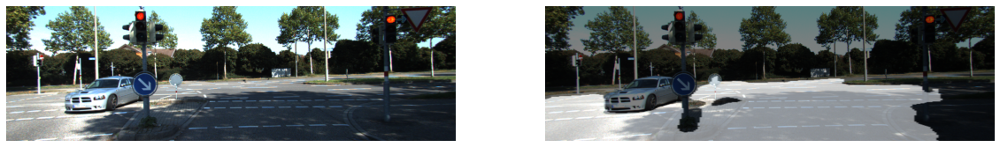

U-Net++ Model
IoU : 0.769122

13번 image


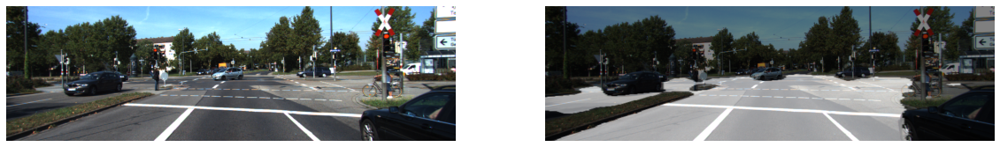

U-Net Model
IoU : 0.910368


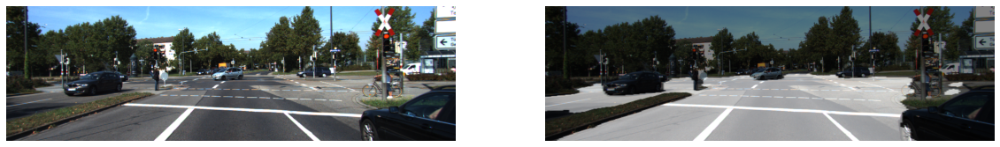

U-Net++ Model
IoU : 0.911917



In [101]:
model.load_weights('./checkpoint/unet_lr_0.0001.hdf5')

for i in [7,11,12,13]:
    print(f'{i}번 image')
    output, prediction, target = get_output(
        model, 
        test_preproc,
        image_path=dir_path + f'/image_2/00{str(i).zfill(4)}_10.png',
        output_path=dir_path + f'./result_{str(i).zfill(3)}.png',
        label_path=dir_path + f'/semantic/00{str(i).zfill(4)}_10.png'
    )
    print('U-Net Model')
    calculate_iou_score(target, prediction)
    
    output, prediction, target = get_output(
        UNetPP, 
        test_preproc,
        image_path=dir_path + f'/image_2/00{str(i).zfill(4)}_10.png',
        output_path=dir_path + f'./result_{str(i).zfill(3)}.png',
        label_path=dir_path + f'/semantic/00{str(i).zfill(4)}_10.png'
    )
    print('U-Net++ Model')
    calculate_iou_score(target, prediction)
    print('')